# Style Transfer using CycleGAN

MRI T1 to T2 style transfer or vice-versa, style of one MRI image to another, which will help in a better understanding of the scanned image. Using GANs we will create T2 weighted images from T1 weighted MRI image and vice-versa.

#### Here we will be creating Generative adversarial model(modified U-Net) which can generate artificial MRI images of different contrast levels from existing MRI scans.

In [1]:
# Importing all required libraries
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
from tensorflow.keras.utils import plot_model
from PIL import Image
import glob
import pathlib
import pandas as pd
import os

#### Storing the images path of T1 and T2 images and sorting them out in proper order. In short a dataset with file path reference has to be created.

In [2]:
t1_images = glob.glob('MRI_T1_T2_Data/Tr1/TrainT1/*.png')
t1_images.sort()
t2_images = glob.glob('MRI_T1_T2_Data/Tr2/TrainT2/*.png')
t2_images.sort()

In [3]:
BATCH_SIZE = 1
BUFFER_SIZE = 256

##### Plotting the sample T1 and T2 images

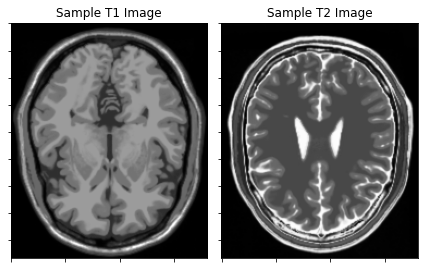

In [4]:
fig, ax = plt.subplots(1, 2)
ax[0].imshow(Image.open(t1_images[0]), cmap='gray')
ax[0].set_title('Sample T1 Image')
ax[0].tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)
ax[1].imshow(Image.open(t2_images[0]), cmap='gray')
ax[1].set_title('Sample T2 Image')
ax[1].tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)
plt.tight_layout()
plt.show()

##### Normalizing the Image and resizing the image
1. Method to resize and normalize the image
2. Apply the method to both the dataset; T1 and T2

In [5]:
import cv2
def normalize_resize_images(images, size):
    images_arr = []
    for idx, img in enumerate(images):
        img = Image.open(img)
        img_array = np.array(img)
        img_array = (img_array / 127.5) - 1.0
        
        img_array = cv2.resize(img_array, (size, size))
        
        images_arr.append(img_array)
    
    return np.array(images_arr)

In [6]:
t1_images_normalized = normalize_resize_images(t1_images.copy(), 128)
t2_images_normalized = normalize_resize_images(t2_images.copy(), 128)

In [7]:
new_shape = t1_images_normalized[0].shape

##### Reshaping the images

In [8]:
def reshape_images(images):
    reshaped_images = []
    for image in images:
        reshaped_image = image.astype(np.float32)
        reshaped_image = reshaped_image[..., np.newaxis]
        reshaped_images.append(reshaped_image)
    return np.array(reshaped_images)
    

In [9]:
t1_images_normalized = reshape_images(t1_images_normalized)
t2_images_normalized = reshape_images(t2_images_normalized)

#### Randomly flipping the images so that we have better augmentation of dataset

In [10]:
def random_flip_image(img, dim):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.resize(img, [*(dim, dim)])
    img = tf.image.random_crop(img, size=[*(dim, dim, 1)])
    return img

In [11]:
data_augmentation = tf.keras.Sequential([tf.keras.layers.RandomFlip("horizontal")])
t1_images_normalized = np.concatenate([data_augmentation(t1_images_normalized), t1_images_normalized], axis=0)
t2_images_normalized = np.concatenate([data_augmentation(t2_images_normalized), t2_images_normalized], axis=0)

2024-05-19 12:54:25.360341: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
2024-05-19 12:54:25.360405: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 14800 MB memory:  -> device: 0, name: Quadro RTX 5000, pci bus id: 0000:1d:00.0, compute capability: 7.5


In [12]:
t1_images_normalized = [random_flip_image(image, 128) for image in t1_images_normalized]
t2_images_normalized = [random_flip_image(image, 128) for image in t2_images_normalized]

#### Verfying the image if the normalization, resizing, reshaping and augmentation is successful or not.

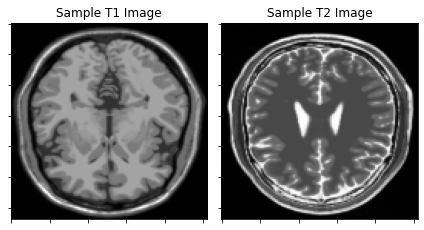

In [13]:
fig, ax = plt.subplots(1, 2)
ax[0].imshow(t1_images_normalized[0], cmap='gray')
ax[0].set_title('Sample T1 Image')
ax[0].tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)
ax[1].imshow(t2_images_normalized[0], cmap='gray')
ax[1].set_title('Sample T2 Image')
ax[1].tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)
plt.tight_layout()
plt.show()

##### Batch and shuffle the data

In [14]:
t1_images_normalized = tf.data.Dataset.from_tensor_slices(t1_images_normalized).shuffle(BUFFER_SIZE, seed=42).batch(BATCH_SIZE)
t2_images_normalized = tf.data.Dataset.from_tensor_slices(t2_images_normalized).shuffle(BUFFER_SIZE, seed=42).batch(BATCH_SIZE)


#### Generating the sample data for both T1 and T2

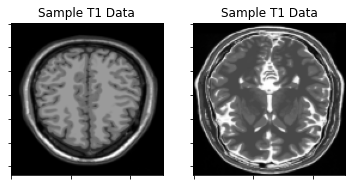

In [15]:
sample_t1_data = next(iter(t1_images_normalized))
sample_t2_data = next(iter(t2_images_normalized))

fig, ax = plt.subplots(1, 2)
ax[0].imshow(sample_t1_data[0].numpy()[:, :, 0], cmap='gray')
ax[0].set_title('Sample T1 Data')
ax[0].tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)
ax[1].imshow(sample_t2_data[0].numpy()[:, :, 0], cmap='gray')
ax[1].set_title('Sample T1 Data')
ax[1].tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)
plt.show()

#### Model Building
1. Instance Normalization
2. Downsampling, Upsampling and Unet
3. Generator Building using Unet
4. Discriminator Building

In [16]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    
    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

#### Downsampling
Downsampling is performed using the Convolution, leading to reduce in dimensions.

In [17]:
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

#### Upsampling
Upsampling is a result of Transposed Convolution, where dimension of image are increased.

In [18]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

##### Unet Generator

In [19]:
# Unet Generator is a combination of Convolution + Transposed Convolution Layers
def unet_generator():
    down_stack = [
        downsample(128, 4, False),
        downsample(128, 4),
        downsample(256, 4), 
        downsample(512, 4), 
        downsample(512, 4), 
        downsample(512, 4), 
        downsample(512, 4) 
    ]
    up_stack = [
        upsample(512, 4, True), 
        upsample(512, 4, True),
        upsample(512, 4, True),
        upsample(512, 4), 
        upsample(256, 4),
        upsample(128, 4),
        upsample(128, 4)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 32, 32, 1)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[128, 128, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

#### Generator
Generator is a Unet Network here since We want to translate One type of Image (T1) into Another type of Image (T2).

In [20]:
generator_g = unet_generator()
generator_f = unet_generator()

Let's also visualize one of our Generator Models since Both our Generators have same architecture.

In [21]:
generator_g.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  2048        ['input_1[0][0]']                
                                                                                                  
 sequential_2 (Sequential)      (None, 32, 32, 128)  262400      ['sequential_1[0][0]']           
                                                                                                  
 sequential_3 (Sequential)      (None, 16, 16, 256)  524800      ['sequential_2[0][0]']       

#### Discriminator
Discriminator is a traditional CNN, which we use to classify the Images. It only uses Downsampling hence.

Both Discriminators have same architecture

In [22]:
# Discriminators only contain Convolutional Layers and no Transposed Convolution is not used 
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (32, 32, 1)
    inp = tf.keras.layers.Input(shape=[128, 128, 1], name='input_image')
    x = inp
    
    # add downsampling step here
    down1 = downsample(64, 4, False)(x)
    down2 = downsample(128, 4, False)(down1)
    down3 = downsample(256, 4)(down2)
    down4 = downsample(512, 4)(down3)
    down5 = downsample(512, 4)(down4)
    # add a padding layer here
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down5) 
    
    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(256, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 7, 7, 256)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    
    # apply zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) 
    
    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) 
    return tf.keras.Model(inputs=inp, outputs=last)

In [23]:
discriminator_x = discriminator()
discriminator_y = discriminator()

Having a look at Discriminator's architecture

In [24]:
discriminator_x.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 128, 128, 1)]     0         
                                                                 
 sequential_29 (Sequential)  (None, 64, 64, 64)        1024      
                                                                 
 sequential_30 (Sequential)  (None, 32, 32, 128)       131072    
                                                                 
 sequential_31 (Sequential)  (None, 16, 16, 256)       524800    
                                                                 
 sequential_32 (Sequential)  (None, 8, 8, 512)         2098176   
                                                                 
 sequential_33 (Sequential)  (None, 4, 4, 512)         4195328   
                                                                 
 zero_padding2d (ZeroPadding  (None, 6, 6, 512)        0   

### Model Training
1. Declare Loss type
2. Calculate Discriminator Loss
3. Calculate Generator Loss
4. Cycle Loss
5. Identity Loss
6. Optimizer
7. Checkpoint Initialization
8. Training Flow

Check output of Untrained Generator models which should be a random noise

2024-05-19 12:54:29.185997: I tensorflow/stream_executor/cuda/cuda_dnn.cc:377] Loaded cuDNN version 8302


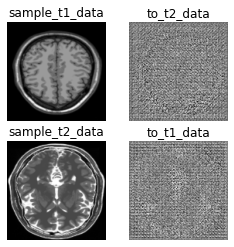

In [25]:
to_t2_data = generator_g(sample_t1_data)
to_t1_data = generator_f(sample_t2_data)
plt.figure(figsize=(4, 4))

imgs = [sample_t1_data, to_t2_data, sample_t2_data, to_t1_data]
title = ['sample_t1_data', 'to_t2_data', 'sample_t2_data', 'to_t1_data']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

#### Declare Loss as Binary Cross Entropy
Since Our Discriminator is a classifier

In [26]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#### Discriminator Loss
It consists of two types of losses
1.    Loss on Real Data
2.    Loss on Fake Data

In [27]:
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

#### Generator Loss
It has only one type of loss - Discriminator Loss on Generated data

In [28]:
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

#### Cycle Loss

In [29]:
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

#### Identity Loss

In [30]:
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

#### Optimizer 
We use Adam Optimizer to update weights which is a good optimizer to achieve quick learning.

In [31]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

We'll train out Model for 200 Epochs

In [32]:
EPOCHS = 200

#### Checkpoint Initialization
Initialize checkpoints to save models

In [33]:
checkpoint_path = "./Trained_Model"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


Function to show Images output by Generators while Training

In [34]:
def generate_images(model1, test_input1, model2, test_input2, epoch):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Predicted Image', 'Input Image', 'Predicted Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('./epoch_images/image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

#### Training FLow
Below Function performs one Flow of Batch Training <p>


Sequence of Training Flow

1.   Generate Fake Y and Cycled X
2.   Generate Fake X and Cycled Y
3.   Generate Fake Images through G and F for Identity Loss.
4.   Calculate Discriminator Loss for Disc X and Disc Y on Fake Data for Generator Training.
5.   Calculate Generator Loss on Discriminator.
6.   Calculate Cycled Loss on Cycled Images from step 1 and 2.
7.   Calculate Total Generator Loss - Disc Loss + Cycled Loss + Identity Loss
8.   Calculate Discriminator Loss on both Fake and Real Images for Disc X and Y for Disc Training.
9.   Calculate the Gradients and update the weight and bias of models.

In [35]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)
        
        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)
        
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)
        
        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
        
        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)
        
        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
        
    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    
    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

#### Training the CycleGAN Model

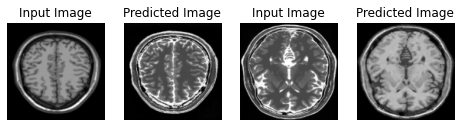

Saving checkpoint for epoch 80 at ./Trained_Model/ckpt-81


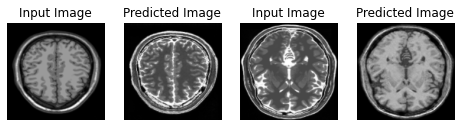

Saving checkpoint for epoch 81 at ./Trained_Model/ckpt-82


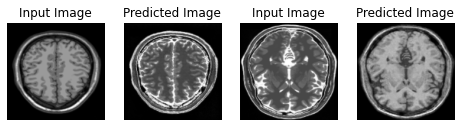

Saving checkpoint for epoch 82 at ./Trained_Model/ckpt-83


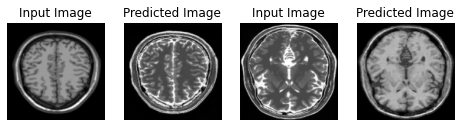

Saving checkpoint for epoch 83 at ./Trained_Model/ckpt-84


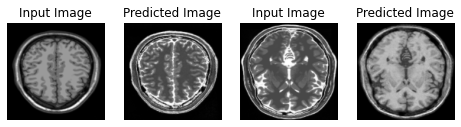

Saving checkpoint for epoch 84 at ./Trained_Model/ckpt-85


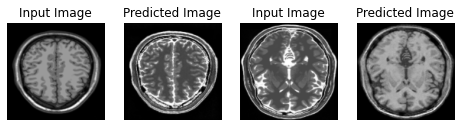

Saving checkpoint for epoch 85 at ./Trained_Model/ckpt-86


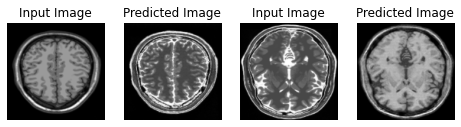

Saving checkpoint for epoch 86 at ./Trained_Model/ckpt-87


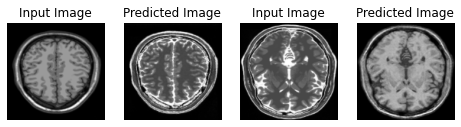

Saving checkpoint for epoch 87 at ./Trained_Model/ckpt-88


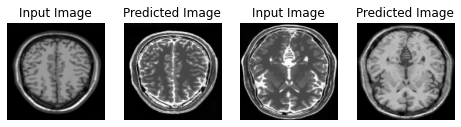

Saving checkpoint for epoch 88 at ./Trained_Model/ckpt-89


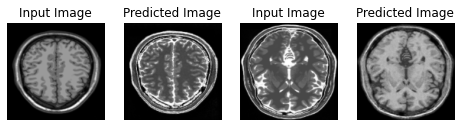

Saving checkpoint for epoch 89 at ./Trained_Model/ckpt-90


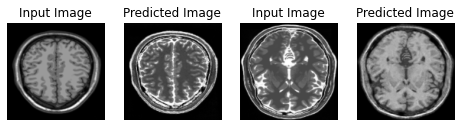

Saving checkpoint for epoch 90 at ./Trained_Model/ckpt-91


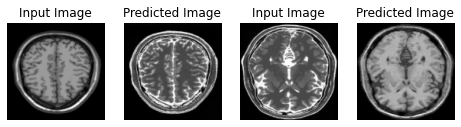

Saving checkpoint for epoch 91 at ./Trained_Model/ckpt-92


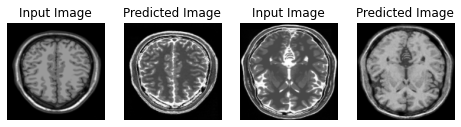

Saving checkpoint for epoch 92 at ./Trained_Model/ckpt-93


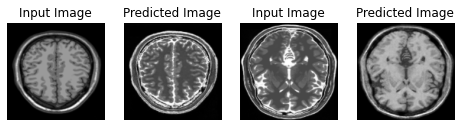

Saving checkpoint for epoch 93 at ./Trained_Model/ckpt-94


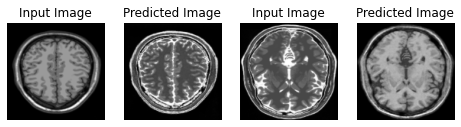

Saving checkpoint for epoch 94 at ./Trained_Model/ckpt-95


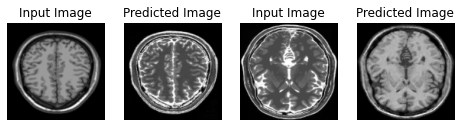

Saving checkpoint for epoch 95 at ./Trained_Model/ckpt-96


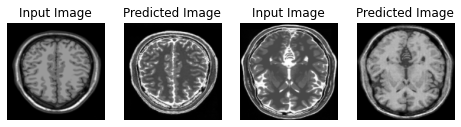

Saving checkpoint for epoch 96 at ./Trained_Model/ckpt-97


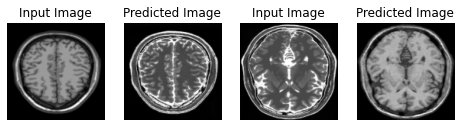

Saving checkpoint for epoch 97 at ./Trained_Model/ckpt-98


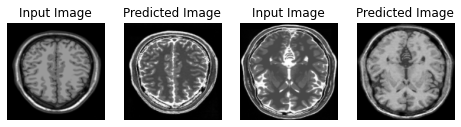

Saving checkpoint for epoch 98 at ./Trained_Model/ckpt-99


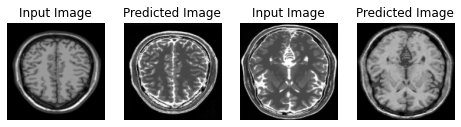

Saving checkpoint for epoch 99 at ./Trained_Model/ckpt-100


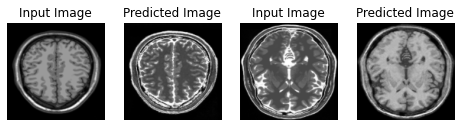

Saving checkpoint for epoch 100 at ./Trained_Model/ckpt-101


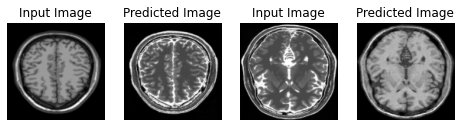

Saving checkpoint for epoch 101 at ./Trained_Model/ckpt-102


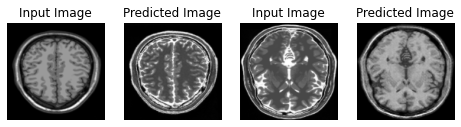

Saving checkpoint for epoch 102 at ./Trained_Model/ckpt-103


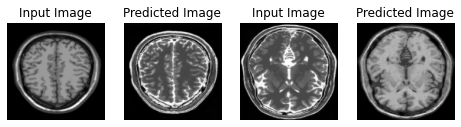

Saving checkpoint for epoch 103 at ./Trained_Model/ckpt-104


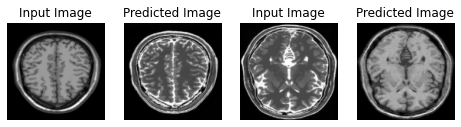

Saving checkpoint for epoch 104 at ./Trained_Model/ckpt-105


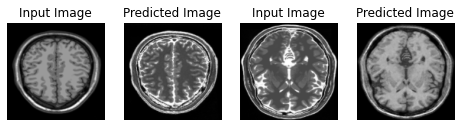

Saving checkpoint for epoch 105 at ./Trained_Model/ckpt-106


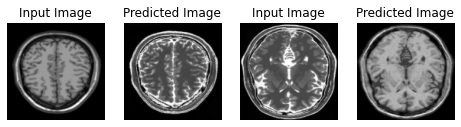

Saving checkpoint for epoch 106 at ./Trained_Model/ckpt-107


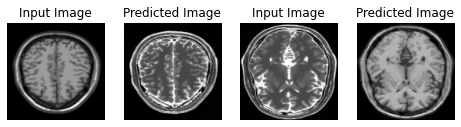

Saving checkpoint for epoch 107 at ./Trained_Model/ckpt-108


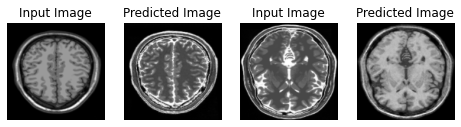

Saving checkpoint for epoch 108 at ./Trained_Model/ckpt-109


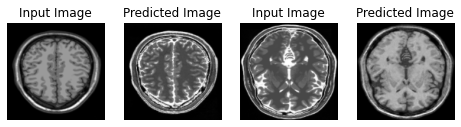

Saving checkpoint for epoch 109 at ./Trained_Model/ckpt-110


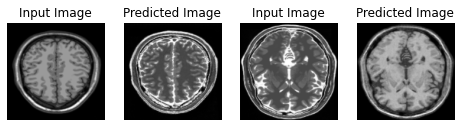

Saving checkpoint for epoch 110 at ./Trained_Model/ckpt-111


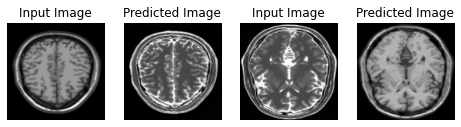

Saving checkpoint for epoch 111 at ./Trained_Model/ckpt-112


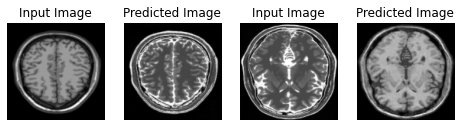

Saving checkpoint for epoch 112 at ./Trained_Model/ckpt-113


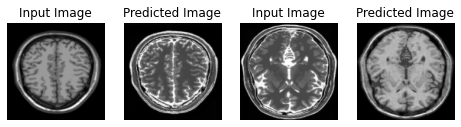

Saving checkpoint for epoch 113 at ./Trained_Model/ckpt-114


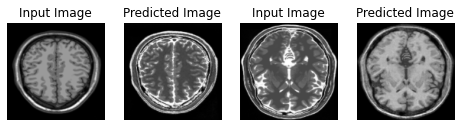

Saving checkpoint for epoch 114 at ./Trained_Model/ckpt-115


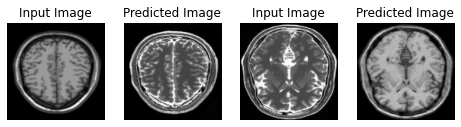

Saving checkpoint for epoch 115 at ./Trained_Model/ckpt-116


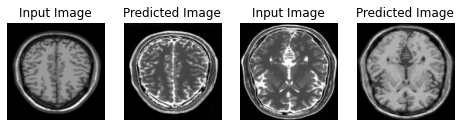

Saving checkpoint for epoch 116 at ./Trained_Model/ckpt-117


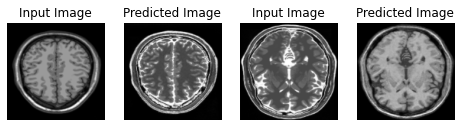

Saving checkpoint for epoch 117 at ./Trained_Model/ckpt-118


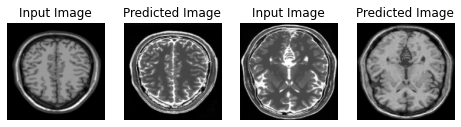

Saving checkpoint for epoch 118 at ./Trained_Model/ckpt-119


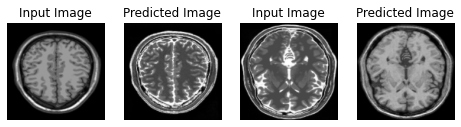

Saving checkpoint for epoch 119 at ./Trained_Model/ckpt-120


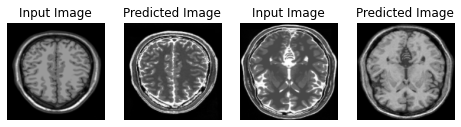

Saving checkpoint for epoch 120 at ./Trained_Model/ckpt-121


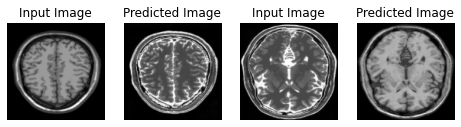

Saving checkpoint for epoch 121 at ./Trained_Model/ckpt-122


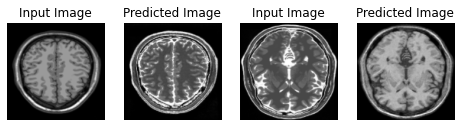

Saving checkpoint for epoch 122 at ./Trained_Model/ckpt-123


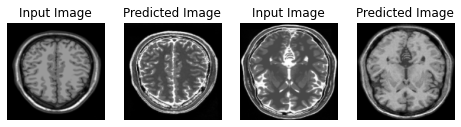

Saving checkpoint for epoch 123 at ./Trained_Model/ckpt-124


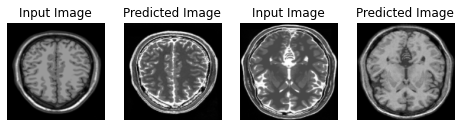

Saving checkpoint for epoch 124 at ./Trained_Model/ckpt-125


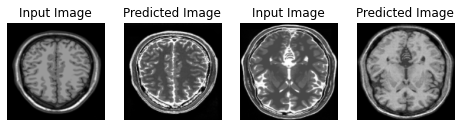

Saving checkpoint for epoch 125 at ./Trained_Model/ckpt-126


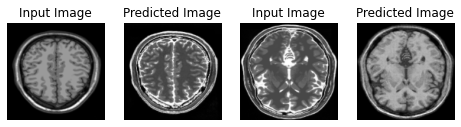

Saving checkpoint for epoch 126 at ./Trained_Model/ckpt-127


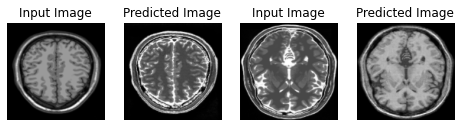

Saving checkpoint for epoch 127 at ./Trained_Model/ckpt-128


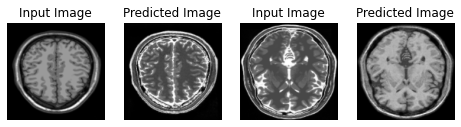

Saving checkpoint for epoch 128 at ./Trained_Model/ckpt-129


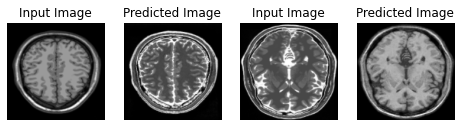

Saving checkpoint for epoch 129 at ./Trained_Model/ckpt-130


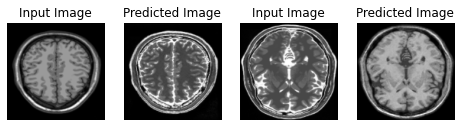

Saving checkpoint for epoch 130 at ./Trained_Model/ckpt-131


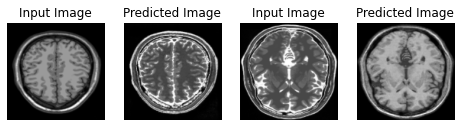

Saving checkpoint for epoch 131 at ./Trained_Model/ckpt-132


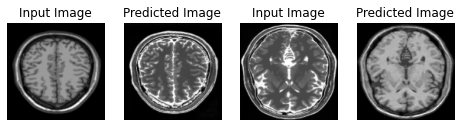

Saving checkpoint for epoch 132 at ./Trained_Model/ckpt-133


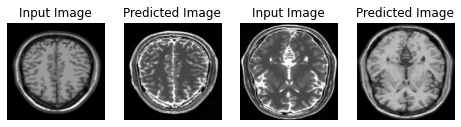

Saving checkpoint for epoch 133 at ./Trained_Model/ckpt-134


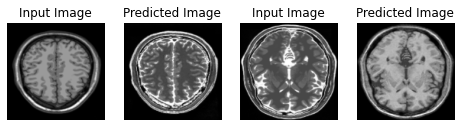

Saving checkpoint for epoch 134 at ./Trained_Model/ckpt-135


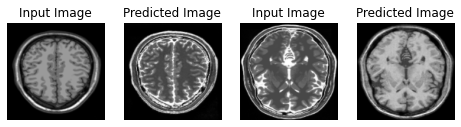

Saving checkpoint for epoch 135 at ./Trained_Model/ckpt-136


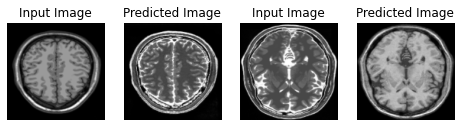

Saving checkpoint for epoch 136 at ./Trained_Model/ckpt-137


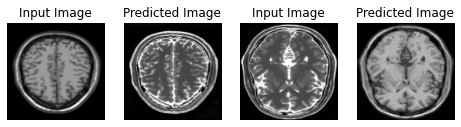

Saving checkpoint for epoch 137 at ./Trained_Model/ckpt-138


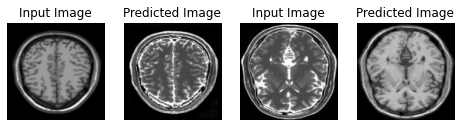

Saving checkpoint for epoch 138 at ./Trained_Model/ckpt-139


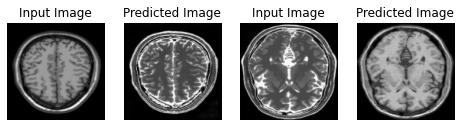

Saving checkpoint for epoch 139 at ./Trained_Model/ckpt-140


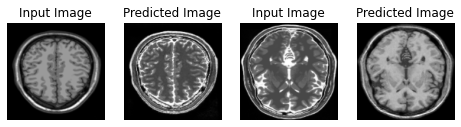

Saving checkpoint for epoch 140 at ./Trained_Model/ckpt-141


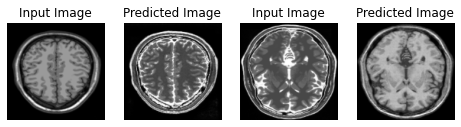

Saving checkpoint for epoch 141 at ./Trained_Model/ckpt-142


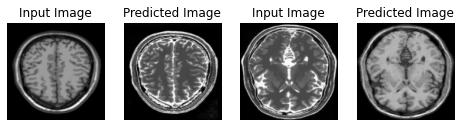

Saving checkpoint for epoch 142 at ./Trained_Model/ckpt-143


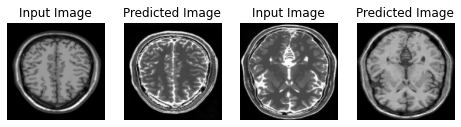

Saving checkpoint for epoch 143 at ./Trained_Model/ckpt-144


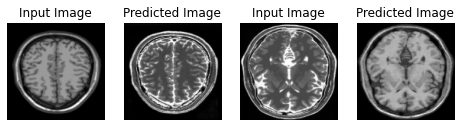

Saving checkpoint for epoch 144 at ./Trained_Model/ckpt-145


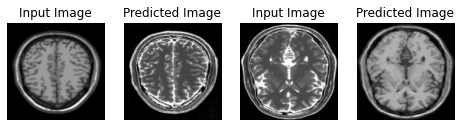

Saving checkpoint for epoch 145 at ./Trained_Model/ckpt-146


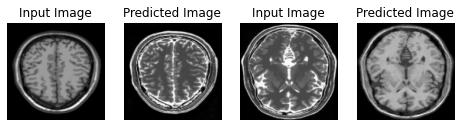

Saving checkpoint for epoch 146 at ./Trained_Model/ckpt-147


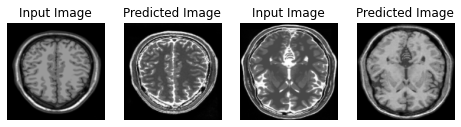

Saving checkpoint for epoch 147 at ./Trained_Model/ckpt-148


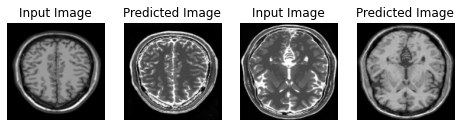

Saving checkpoint for epoch 148 at ./Trained_Model/ckpt-149


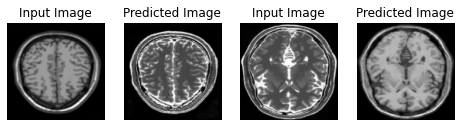

Saving checkpoint for epoch 149 at ./Trained_Model/ckpt-150


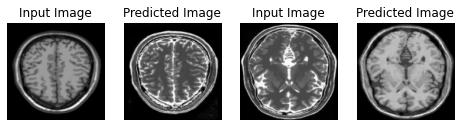

Saving checkpoint for epoch 150 at ./Trained_Model/ckpt-151


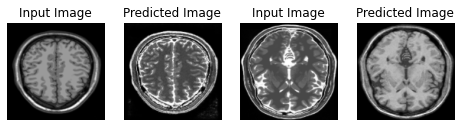

Saving checkpoint for epoch 151 at ./Trained_Model/ckpt-152


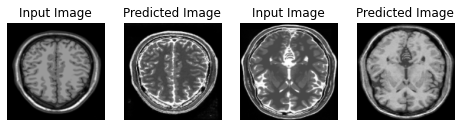

Saving checkpoint for epoch 152 at ./Trained_Model/ckpt-153


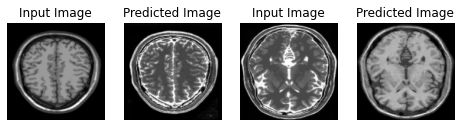

Saving checkpoint for epoch 153 at ./Trained_Model/ckpt-154


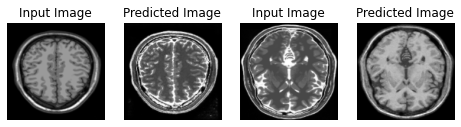

Saving checkpoint for epoch 154 at ./Trained_Model/ckpt-155


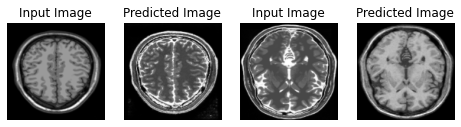

Saving checkpoint for epoch 155 at ./Trained_Model/ckpt-156


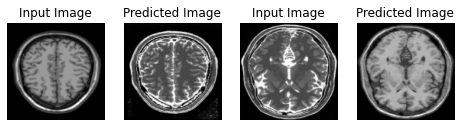

Saving checkpoint for epoch 156 at ./Trained_Model/ckpt-157


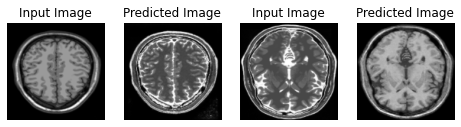

Saving checkpoint for epoch 157 at ./Trained_Model/ckpt-158


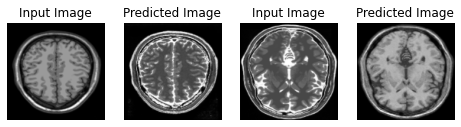

Saving checkpoint for epoch 158 at ./Trained_Model/ckpt-159


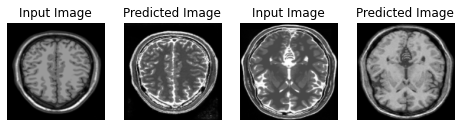

Saving checkpoint for epoch 159 at ./Trained_Model/ckpt-160


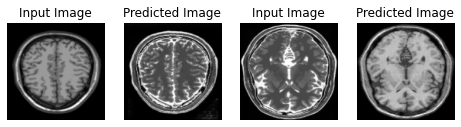

Saving checkpoint for epoch 160 at ./Trained_Model/ckpt-161


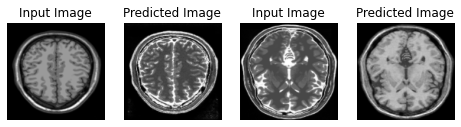

Saving checkpoint for epoch 161 at ./Trained_Model/ckpt-162


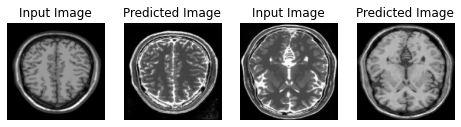

Saving checkpoint for epoch 162 at ./Trained_Model/ckpt-163


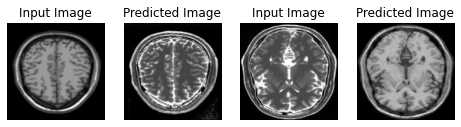

Saving checkpoint for epoch 163 at ./Trained_Model/ckpt-164


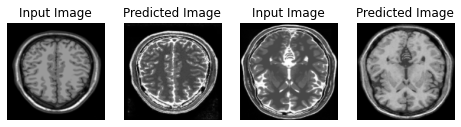

Saving checkpoint for epoch 164 at ./Trained_Model/ckpt-165


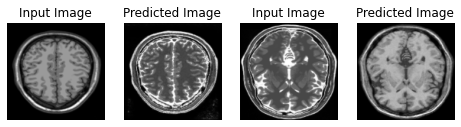

Saving checkpoint for epoch 165 at ./Trained_Model/ckpt-166


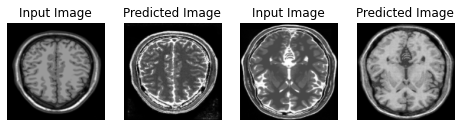

Saving checkpoint for epoch 166 at ./Trained_Model/ckpt-167


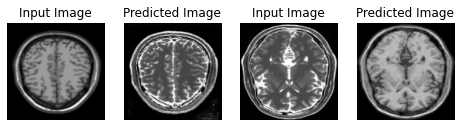

Saving checkpoint for epoch 167 at ./Trained_Model/ckpt-168


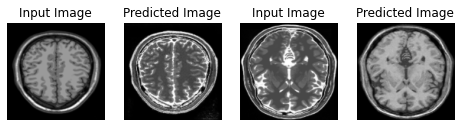

Saving checkpoint for epoch 168 at ./Trained_Model/ckpt-169


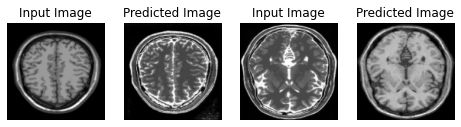

Saving checkpoint for epoch 169 at ./Trained_Model/ckpt-170


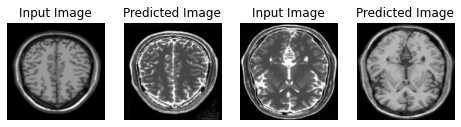

Saving checkpoint for epoch 170 at ./Trained_Model/ckpt-171


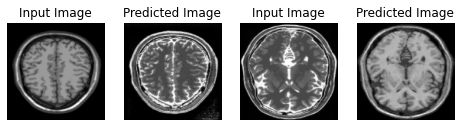

Saving checkpoint for epoch 171 at ./Trained_Model/ckpt-172


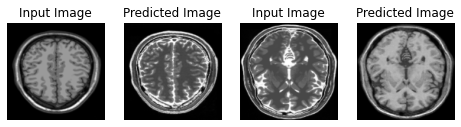

Saving checkpoint for epoch 172 at ./Trained_Model/ckpt-173


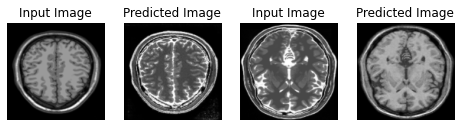

Saving checkpoint for epoch 173 at ./Trained_Model/ckpt-174


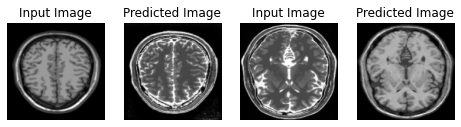

Saving checkpoint for epoch 174 at ./Trained_Model/ckpt-175


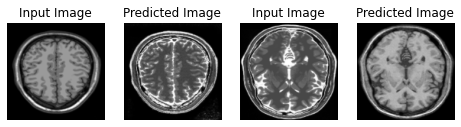

Saving checkpoint for epoch 175 at ./Trained_Model/ckpt-176


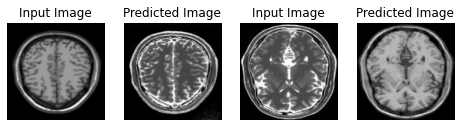

Saving checkpoint for epoch 176 at ./Trained_Model/ckpt-177


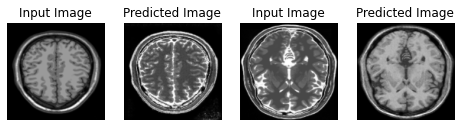

Saving checkpoint for epoch 177 at ./Trained_Model/ckpt-178


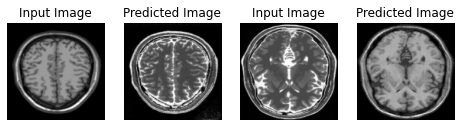

Saving checkpoint for epoch 178 at ./Trained_Model/ckpt-179


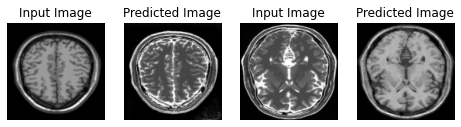

Saving checkpoint for epoch 179 at ./Trained_Model/ckpt-180


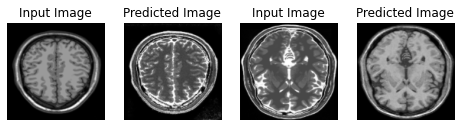

Saving checkpoint for epoch 180 at ./Trained_Model/ckpt-181


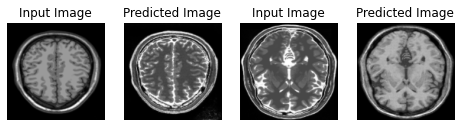

Saving checkpoint for epoch 181 at ./Trained_Model/ckpt-182


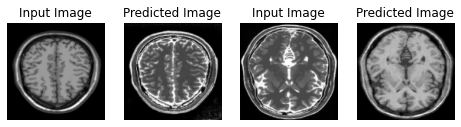

Saving checkpoint for epoch 182 at ./Trained_Model/ckpt-183


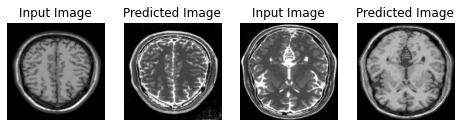

Saving checkpoint for epoch 183 at ./Trained_Model/ckpt-184


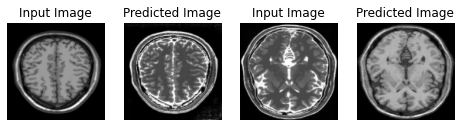

Saving checkpoint for epoch 184 at ./Trained_Model/ckpt-185


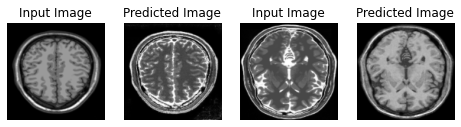

Saving checkpoint for epoch 185 at ./Trained_Model/ckpt-186


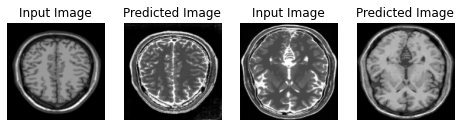

Saving checkpoint for epoch 186 at ./Trained_Model/ckpt-187


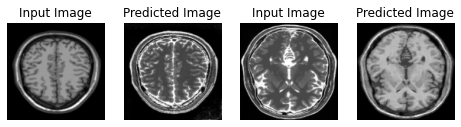

Saving checkpoint for epoch 187 at ./Trained_Model/ckpt-188


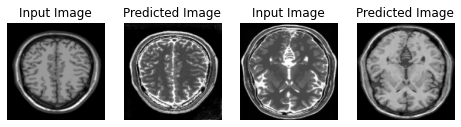

Saving checkpoint for epoch 188 at ./Trained_Model/ckpt-189


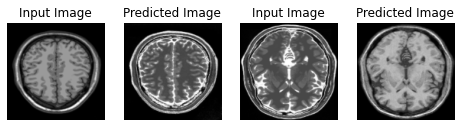

Saving checkpoint for epoch 189 at ./Trained_Model/ckpt-190


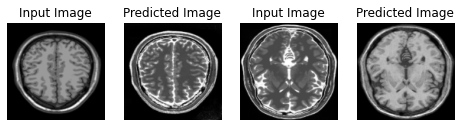

Saving checkpoint for epoch 190 at ./Trained_Model/ckpt-191


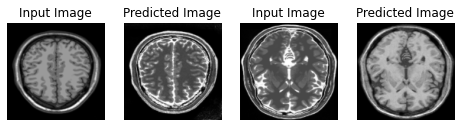

Saving checkpoint for epoch 191 at ./Trained_Model/ckpt-192


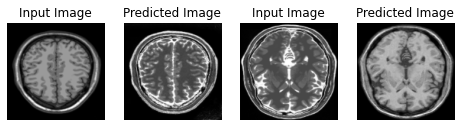

Saving checkpoint for epoch 192 at ./Trained_Model/ckpt-193


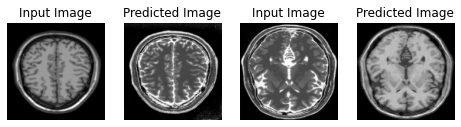

Saving checkpoint for epoch 193 at ./Trained_Model/ckpt-194


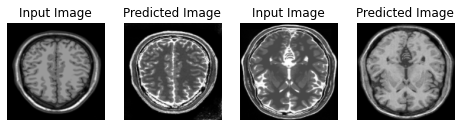

Saving checkpoint for epoch 194 at ./Trained_Model/ckpt-195


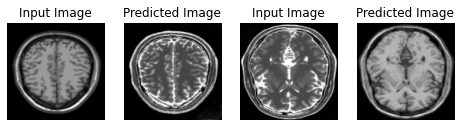

Saving checkpoint for epoch 195 at ./Trained_Model/ckpt-196


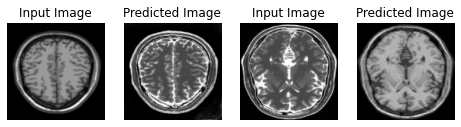

Saving checkpoint for epoch 196 at ./Trained_Model/ckpt-197


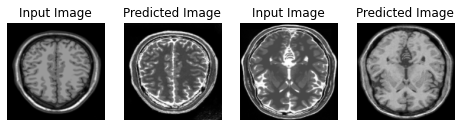

Saving checkpoint for epoch 197 at ./Trained_Model/ckpt-198


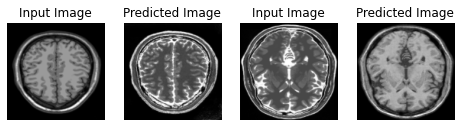

Saving checkpoint for epoch 198 at ./Trained_Model/ckpt-199


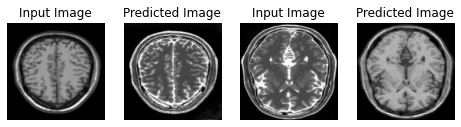

Saving checkpoint for epoch 199 at ./Trained_Model/ckpt-200


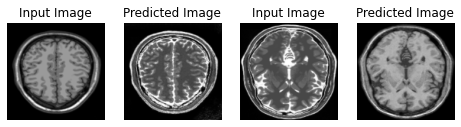

Saving checkpoint for epoch 200 at ./Trained_Model/ckpt-201


In [37]:
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((t1_images_normalized, t2_images_normalized)):
        train_step(image_x, image_y)
    generate_images(generator_g, sample_t1_data, generator_f, sample_t2_data, epoch)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

### Generating a GIF for visualization of Results

In [40]:
import imageio
anim_file = 'mri_gan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('./epoch_images/*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

/var/folders/_p/l2hq10612h35xnw7k6f17qsm0000gq/T/ipykernel_32457/2761658040.py:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
/var/folders/_p/l2hq10612h35xnw7k6f17qsm0000gq/T/ipykernel_32457/2761658040.py:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)



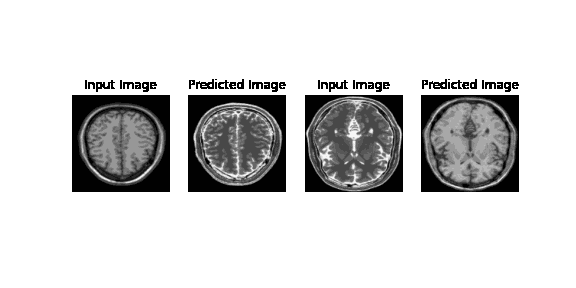

In [41]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

##### Run the trained model on the test dataset T1 to T2 image

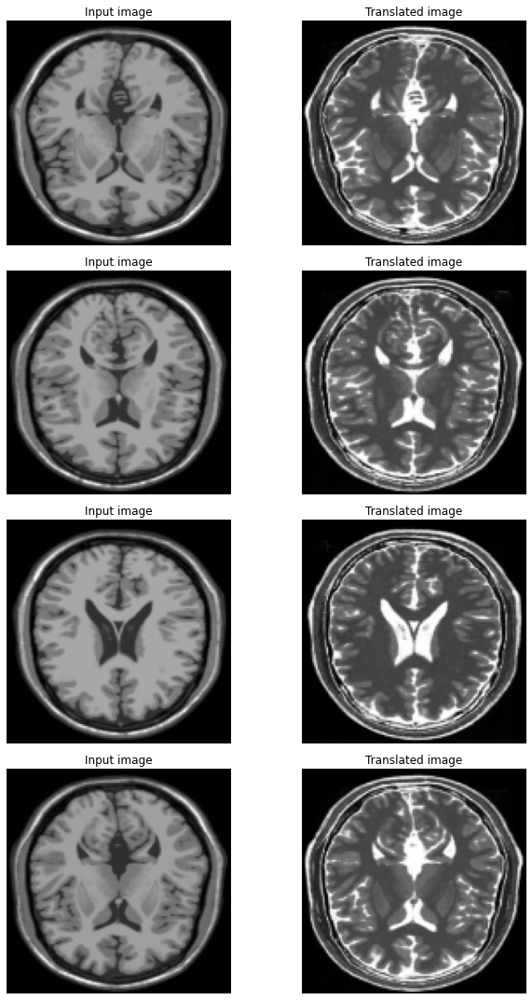

In [46]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(t1_images_normalized.take(4)):
    prediction = generator_g(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img, cmap="gray")
    ax[i, 1].imshow(prediction, cmap="gray")
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = tf.keras.utils.array_to_img(prediction)
plt.tight_layout()
plt.show()

##### Run the trained model on the test dataset T2 to T1 images

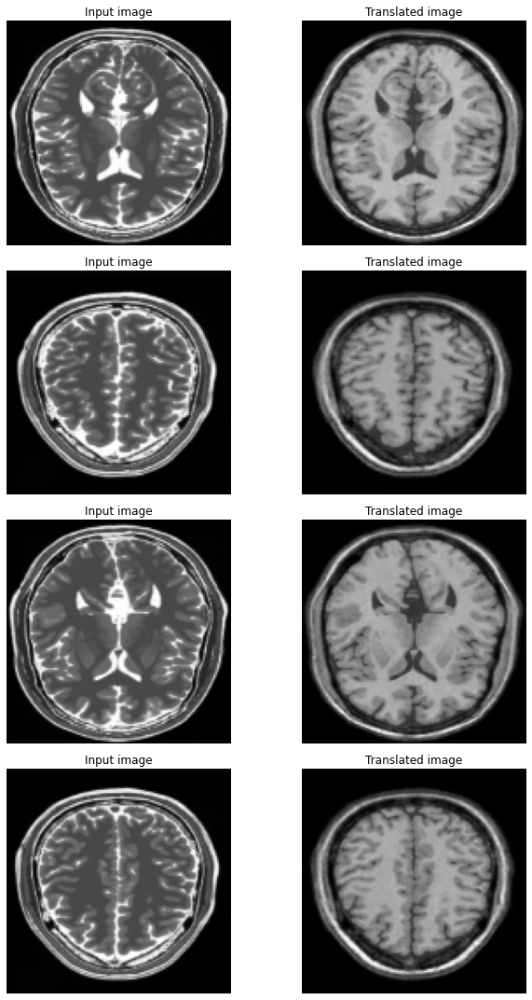

In [47]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(t2_images_normalized.take(4)):
    prediction = generator_f(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img, cmap="gray")
    ax[i, 1].imshow(prediction, cmap="gray")
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = tf.keras.utils.array_to_img(prediction)
plt.tight_layout()
plt.show()